# Image Search Engine using CLIP:

In our previous project, we focused on text data and developed a search engine for job tasks based on job titles (available at https://github.com/saharhekmatdoust/math-dl-project1/blob/main/JobSearchEngine.ipynb). In this project, we aim to extend this concept and utilize image embeddings to develop a mini Google image search engine that integrates both text and images. The objective is to enable users to search for related images by inputting either text or image queries. To achieve this goal, we employed the Contrastive Language-Image Pre-Training (CLIP) model.

Developing a search engine using CLIP can be a demanding and complex process that requires significant amounts of data, computing power, and expertise in machine learning and search technologies. However, the results of this process can be highly precise and beneficial for various applications, such as e-commerce, visual storytelling, or content curation.

The project is categorized into four sections to cater to the diverse needs and preferences of the users:

##### 1. Image Search by text query
##### 2. Image Search by image
##### 3. Image Search by combining text and image
##### 4. Image Search by text or video query

By providing these four distinct sections, we aim to offer users an efficient and personalized search experience. The first section allows users to input a text query and retrieve relevant images, while the second section enables users to upload an image and receive similar images. The third section combines both text and image to produce more refined search results. Finally, the fourth section extends the search engine to video content, allowing users to input a text or video query and receive relevant video results.

Overall, our project aims to leverage the power of CLIP to provide users with a comprehensive and user-friendly search experience that integrates text and image data.



## StreamLit:

For this project, we created a StreamLit application that enables users to choose between searching by text or image. After receiving input from the user, the app displays the top three relevant search results. You can access the StreamLit app using the following link: https://saharhekmatdoust-math-dl-project2-clip-streamlit-uqkq0h.streamlit.app/.

The application works efficiently on localhost and delivers results promptly. However, due to the resource constraints of StreamLit and server failures, the app performs slower on the cloud and requires a reboot after each use. We have included screenshots of our application for your reference.

Overall, our StreamLit application complements the project by providing a user-friendly interface for users to search for images using text or images. Despite the challenges faced while deploying the app on the cloud, it has proven to be effective in local environments.

### StreamLit - Image search by text:


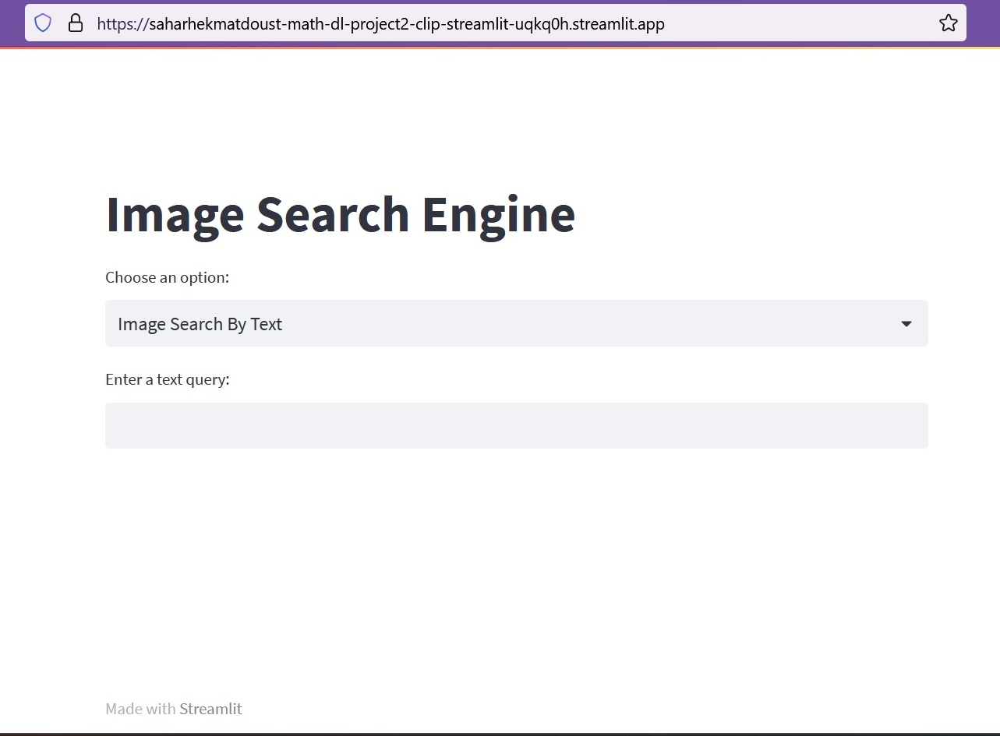

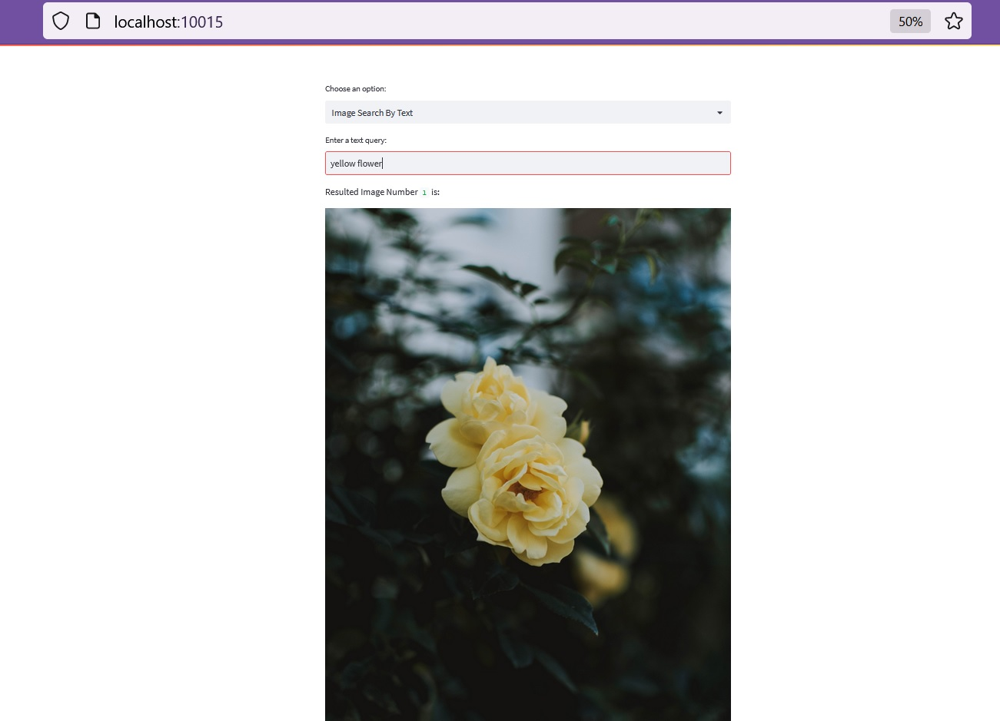

### StreamLit - Image search by image:


#### The original photo is this:
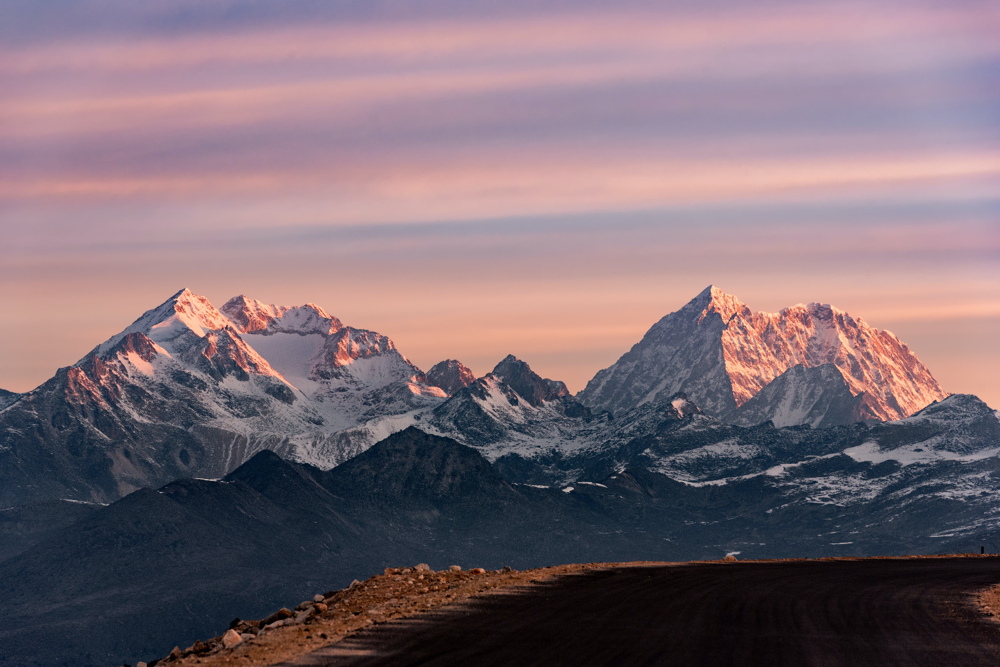
#### And the result is as below:
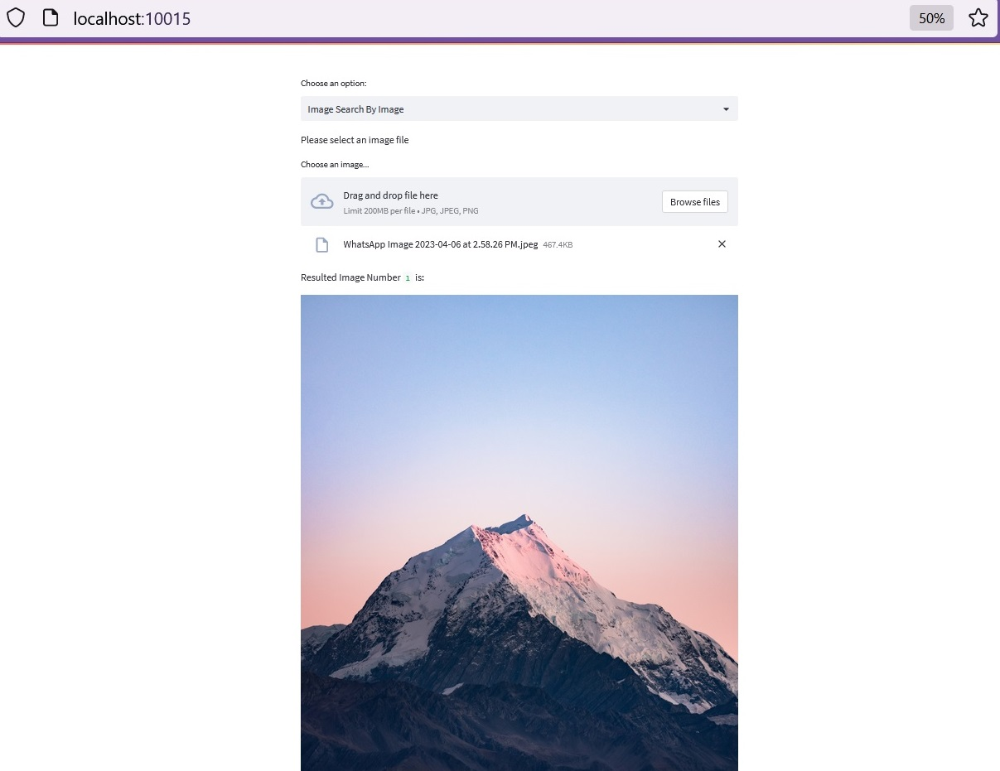

## Github Pages


To increase the accessibility and availability of our project as a reference work, we have deployed a GitHub Pages website for this notebook. The link to the GitHub Pages website is as follows:

https://saharhekmatdoust.github.io/Math_DL_project2/image-search-engine-clip.html

The GitHub Pages website serves as an online platform for our project, providing a permanent link to our work. This allows for easy access and reference to the project at any time. Additionally, the website serves as a showcase for the project, allowing others to explore and learn from our work.

By deploying a GitHub Pages website, we have taken a crucial step in making our project more accessible and valuable to the academic community.

## CLIP
CLIP (Contrastive Language-Image Pre-Training) is a deep learning model developed by OpenAI, which learns to establish associations between images and text to perform a variety of downstream tasks such as image and text classification, image captioning, and visual question answering (OpenAI, 2021).

The model is trained on a large dataset of images and their corresponding captions, enabling it to map both images and text into a shared feature space where similarities between the two can be measured. Consequently, CLIP can identify objects in images based on their textual descriptions or generate captions for images based on their visual features.

CLIP has a wide range of potential use cases, including image and text classification and search engines, image captioning, visual question answering, and natural language processing. By encoding natural language text into a common feature space, it allows for more accurate text classification and other natural language processing tasks.

The figure below depicts the architecture of the CLIP model:



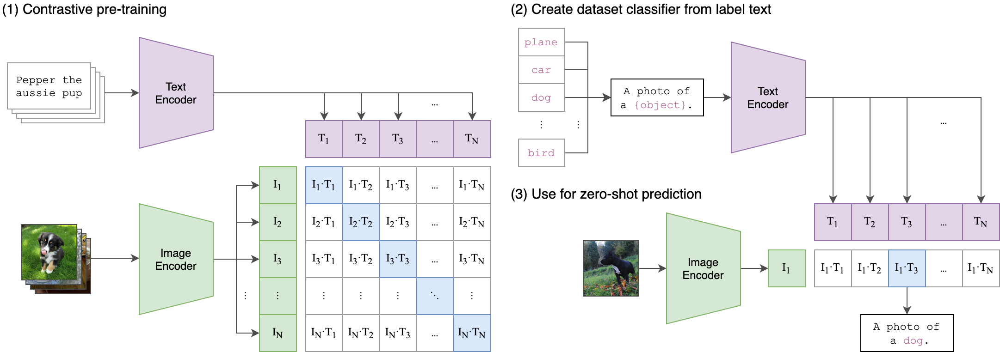


## The Unsplash Dataset

The Unsplash Dataset is a valuable resource for research and learning, containing over 250,000 contributing global photographers and data sourced from millions of searches across a wide variety of uses and contexts. Its broad scope and diverse range of intent and semantics make it a highly versatile and valuable tool for a variety of applications.

The Unsplash Dataset is offered in two distinct versions: the Lite dataset, which is available for commercial and noncommercial usage and contains 25,000 nature-themed Unsplash photos, 25,000 keywords, and 1 million searches, and the Full dataset, which is available for noncommercial usage and contains over 3 million high-quality Unsplash photos, 5 million keywords, and more than 250 million searches.

For our project, we utilized the Lite version of the Unsplash Dataset, specifically the first 15,000 rows, to build our search engine. This dataset provided us with a sufficient amount of data to train our model and produce accurate and relevant search results. The Unsplash Dataset's breadth and quality of data make it an excellent resource for researchers and developers in a wide range of fields. (https://github.com/unsplash/datasets)



In [1]:
import cv2
import pandas as pd
import torch
import numpy as np
import requests
from PIL import Image
import matplotlib.pyplot as plt
from io import BytesIO
device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
# Load the TSV file into a DataFrame
df = pd.read_csv('/kaggle/input/unsplash/photos.tsv000', sep='\t')
df.head()


,photo_id,photo_url,photo_image_url,photo_submitted_at,photo_featured,photo_width,photo_height,photo_aspect_ratio,photo_description,photographer_username,...,photo_location_country,photo_location_city,stats_views,stats_downloads,ai_description,ai_primary_landmark_name,ai_primary_landmark_latitude,ai_primary_landmark_longitude,ai_primary_landmark_confidence,blur_hash
0,XMyPniM9LF0,https://unsplash.com/photos/XMyPniM9LF0,https://images.unsplash.com/uploads/1411949294...,2014-09-29 00:08:38.594364,t,4272,2848,1.50,Woman exploring a forest,michellespencer77,...,NaN,NaN,2375421,6967,woman walking in the middle of forest,NaN,NaN,NaN,NaN,L56bVcRRIWMh.gVunlS4SMbsRRxr
1,rDLBArZUl1c,https://unsplash.com/photos/rDLBArZUl1c,https://images.unsplash.com/photo-141633941111...,2014-11-18 19:36:57.08945,t,3000,4000,0.75,Succulents in a terrarium,ugmonk,...,NaN,NaN,13784815,82141,succulent plants in clear glass terrarium,NaN,NaN,NaN,NaN,LvI$4txu%2s:_4t6WUj]xat7RPoe
2,cNDGZ2sQ3Bo,https://unsplash.com/photos/cNDGZ2sQ3Bo,https://images.unsplash.com/photo-142014251503...,2015-01-01 20:02:02.097036,t,2564,1710,1.50,Rural winter mountainside,johnprice,...,NaN,NaN,1302461,3428,rocky mountain under gray sky at daytime,NaN,NaN,NaN,NaN,LhMj%NxvM{t7_4t7aeoM%2M{ozj[
3,iuZ_D1eoq9k,https://unsplash.com/photos/iuZ_D1eoq9k,https://images.unsplash.com/photo-141487280988...,2014-11-01 20:15:13.410073,t,2912,4368,0.67,Poppy seeds and flowers,krisatomic,...,NaN,NaN,2890238,33704,red common poppy flower selective focus phography,NaN,NaN,NaN,NaN,LSC7DirZAsX7}Br@GEWWmnoLWCnj
4,BeD3vjQ8SI0,https://unsplash.com/photos/BeD3vjQ8SI0,https://images.unsplash.com/photo-141700759404...,2014-11-26 13:13:50.134383,t,4896,3264,1.50,Silhouette near dark trees,jonaseriksson,...,NaN,NaN,8704860,49662,trees during night time,NaN,NaN,NaN,NaN,L25|_:V@0hxtI=W;odae0ht6=^NG


In [3]:
df=df[['photo_id','photo_image_url','photo_description']]
df.head()

,photo_id,photo_image_url,photo_description
0,XMyPniM9LF0,https://images.unsplash.com/uploads/1411949294...,Woman exploring a forest
1,rDLBArZUl1c,https://images.unsplash.com/photo-141633941111...,Succulents in a terrarium
2,cNDGZ2sQ3Bo,https://images.unsplash.com/photo-142014251503...,Rural winter mountainside
3,iuZ_D1eoq9k,https://images.unsplash.com/photo-141487280988...,Poppy seeds and flowers
4,BeD3vjQ8SI0,https://images.unsplash.com/photo-141700759404...,Silhouette near dark trees


# Methodology:

Our methodology comprises several steps:

First, we collected a dataset of 25,000 images from the Unsplash dataset. To analyze these images, we employed a deep learning model, specifically the sentence-transformers/clip-ViT-B-32 model from Hugging Face, which allowed us to create embeddings and extract features for each image in the dataset.

Once the user enters a text query, the model uses the previously created embeddings to find and display the most relevant images, based on the similarity between the query and the images' features.

Furthermore, we investigated video processing by feeding a video into our model and capturing frames from it. By utilizing our model, we conducted specific searches such as "sky," "cars," and "sea" among the frames. As a result, the model returned the frames most relevant to the query.

Our approach provides a highly efficient and precise way of retrieving relevant images based on textual input. Moreover, we can effectively search for relevant frames within videos using our model.

# Model:
For this project, we used the sentence-transformers/clip-ViT-B-32 model from Hugging Face. This model is based on the Contrastive Language-Image Pre-Training (CLIP) framework and is capable of mapping text and images to a shared vector space.

By utilizing the sentence-transformers library, we were able to embed both images and text into the same vector space. This enabled us to implement an image search functionality that finds similar images based on their embedding similarity to a text query. 

In [4]:
!pip install sentence_transformers transformers
from sentence_transformers import SentenceTransformer
model1 = SentenceTransformer('clip-ViT-B-32')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for sentence_transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=87499023c0abdb4ee19875e4b65b6808c22ca55cf7ec05eb2af087f94216a243
  Stored in directory: /root/.cache/pip/wheels/83/71/2b/40d17d21937fed496fb99145227eca8f20b4891240ff60c86f
Successfully built sentence_transformers


In [7]:
model1.to(device)

SentenceTransformer(
  (0): CLIPModel()
)

One of the challenges we faced while working with the Unsplash dataset was the presence of faulty image URLs. This resulted in a large number of errors while trying to extract features and embeddings from the images. To mitigate this issue, we had to remove these faulty URLs from the dataset before proceeding with our analysis. This ensured that our model performed optimally and produced accurate results without being hindered by faulty data.

#### Creating embeddings for the images:

In [5]:
import requests
from PIL import Image
from io import BytesIO
import torch
url_list=df['photo_image_url'].tolist()
# Define a list to store the indices of the faulty URLs
faulty_indices = []

img_embeddings = []

for i, url in enumerate(url_list[:15000]):
    try:
        response = requests.get(url)
        image = Image.open(BytesIO(response.content))
        image_em = model1.encode(image,show_progress_bar=False)
        img_embeddings.append(image_em)
        if (i+1) % 1000== 0:
            print("Processed {} samples".format(i+1))
    except:
        # If there was an error processing the URL, append the index to the faulty_indices list
        faulty_indices.append(i)

        continue


Processed 1000 samples
Processed 2000 samples


/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (96012000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Processed 3000 samples
Processed 4000 samples
Processed 5000 samples


/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (99996755 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Processed 6000 samples


/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (96768910 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,
/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (99991727 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Processed 7000 samples
Processed 8000 samples
Processed 9000 samples


/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (143040000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,
/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (94212096 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Processed 10000 samples


/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (121500000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Processed 11000 samples


/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (107424768 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,
/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (147015000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,
/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (107184040 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Processed 12000 samples


/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (146784000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Processed 13000 samples


/opt/conda/lib/python3.7/site-packages/PIL/Image.py:3170: DecompressionBombWarning: Image size (90671520 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


Processed 14000 samples
Processed 15000 samples


In [6]:
len(img_embeddings)

14992

In [7]:
faulty_indices

[163, 1505, 3097, 4506, 11488, 13011, 13566, 14537]

In [22]:
#img_embeddings
import numpy as np
image_embeddings = np.array(img_embeddings)

# Save the array to a .npy file
np.save('image_features1.npy', image_embeddings)

In [8]:
df2=df.head(15000)
df2=df2.drop(labels=faulty_indices ,axis=0)
df2 = df2.reset_index()
df2['img_embeddings']=img_embeddings
df2.to_csv('final_df_with_embeddings.csv')

In [9]:
df2.head()

,index,photo_id,photo_image_url,photo_description,img_embeddings
0,0,XMyPniM9LF0,https://images.unsplash.com/uploads/1411949294...,Woman exploring a forest,"[-0.28357166, 0.6603953, 0.15704419, 0.1067858..."
1,1,rDLBArZUl1c,https://images.unsplash.com/photo-141633941111...,Succulents in a terrarium,"[-0.48558712, 0.41402024, -0.121365234, 0.1435..."
2,2,cNDGZ2sQ3Bo,https://images.unsplash.com/photo-142014251503...,Rural winter mountainside,"[-0.31590873, 0.6827722, 0.04307574, 0.2806446..."
3,3,iuZ_D1eoq9k,https://images.unsplash.com/photo-141487280988...,Poppy seeds and flowers,"[0.0051131845, 0.17519622, -0.23967189, -0.345..."
4,4,BeD3vjQ8SI0,https://images.unsplash.com/photo-141700759404...,Silhouette near dark trees,"[-0.2817433, 0.017431736, -0.17361663, 0.06159..."


## 1. Image Search by text

In [11]:
def cosine_sim(a,b):
    dot_product = np.dot(a, b)

    # compute magnitudes
    magnitude_a = np.sqrt(np.dot(a, a))
    magnitude_b = np.sqrt(np.dot(b, b))

    # compute cosine similarity
    cos_sim = dot_product / (magnitude_a * magnitude_b)
    return cos_sim

### 1a. Searching for "roads inside the woods"

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

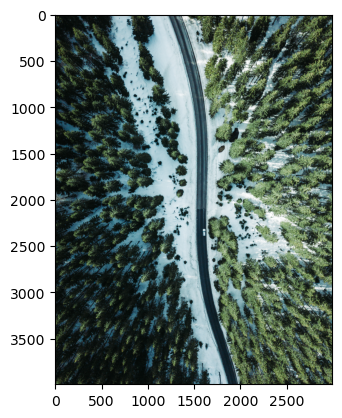

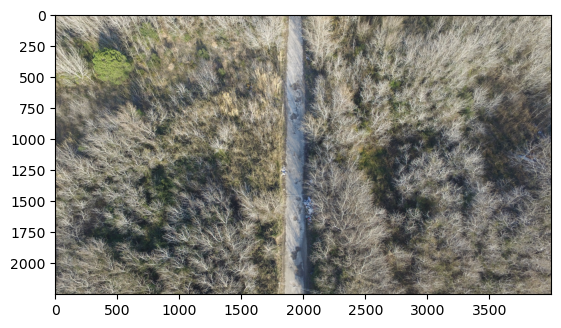

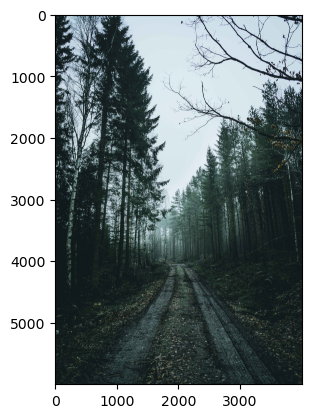

In [12]:
example_query=np.array(model1.encode("roads inside the woods", show_progress_bar=True))
cosine_sims = [cosine_sim(example_query,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()
    

### 1b. Searching for "dogs in nature"

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

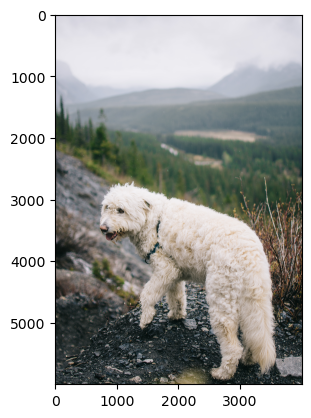

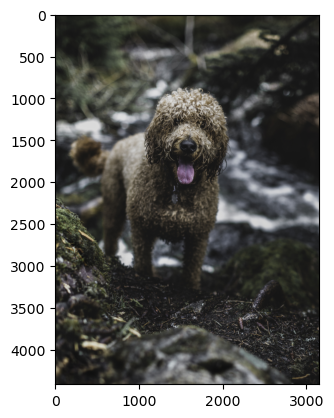

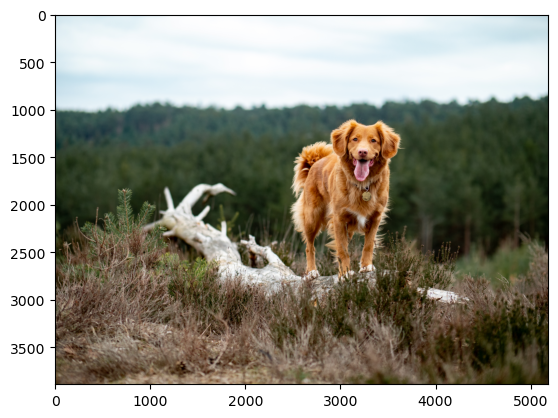

In [13]:
example_query=np.array(model1.encode("dogs in nature", show_progress_bar=True))
cosine_sims = [cosine_sim(example_query,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

### 1c. Searching for "happy wife"

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

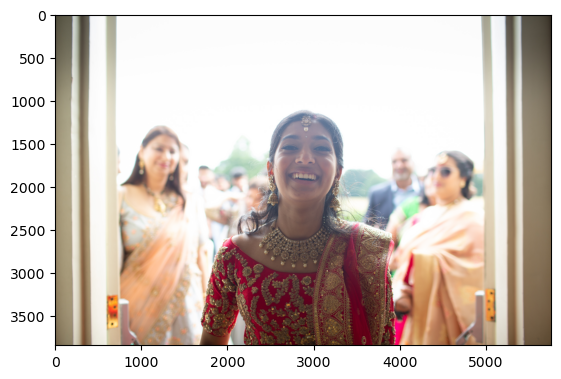

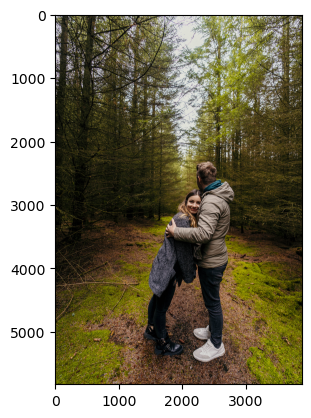

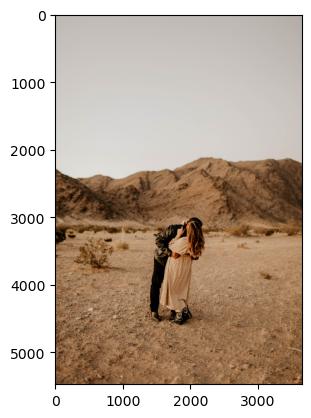

In [14]:
import numpy as np
example_query=np.array(model1.encode("happy wife", show_progress_bar=True))
cosine_sims = [cosine_sim(example_query,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

### 1d. Searching for "red flower"

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

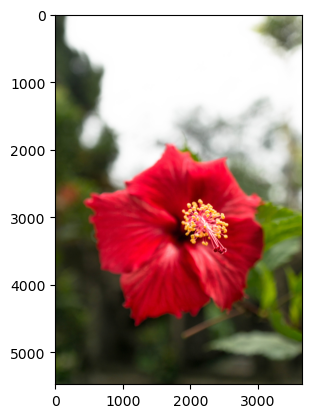

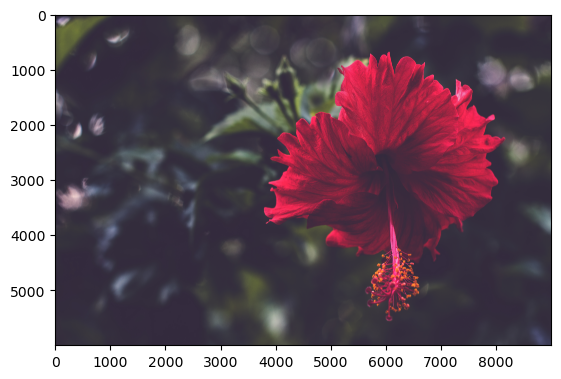

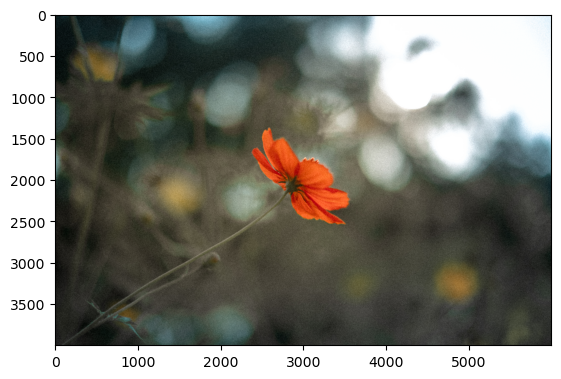

In [15]:
example_query=np.array(model1.encode("red flower", show_progress_bar=True))
cosine_sims = [cosine_sim(example_query,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

## 2.Image-to-Image Search

Our search engine also offers an image-to-image search functionality. Users can upload an image and retrieve similar images from our dataset.

To implement this feature, we drew inspiration from the Image Search example provided by the SentenceTransformers library (https://github.com/UKPLab/sentence-transformers/blob/master/examples/applications/image-search/Image_Search.ipynb). We used the same deep learning model to create embeddings for the images in our dataset and the user-provided image. We then used cosine similarity to measure the similarity between the embeddings and returned the top matching images as the search results.

This functionality enables users to easily discover similar images based on visual features, which can be useful in various applications such as finding alternative versions of a specific image or discovering new images based on a particular style or visual concept.

In [16]:
sample_image1= Image.open("/kaggle/input/sampleinput/alice-triquet-HeEJU3nrg_0-unsplash.jpg")
sample_image2= Image.open("/kaggle/input/sampleinput/jerry-zhang-SJGiS1JzUCc-unsplash.jpg")
sample_image3= Image.open("/kaggle/input/sampleinput/keith-tanner-f-U6iHYUzO8-unsplash.jpg")

### 2a. Searching using this image "/kaggle/input/sampleinput/alice-triquet-HeEJU3nrg_0-unsplash.jpg"

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inserted image:


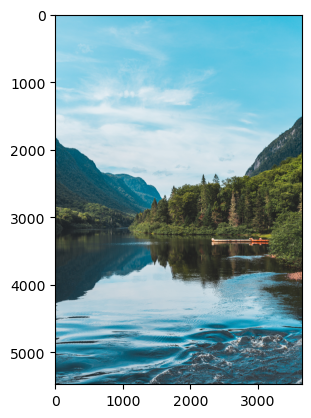

similar images by CLIP:


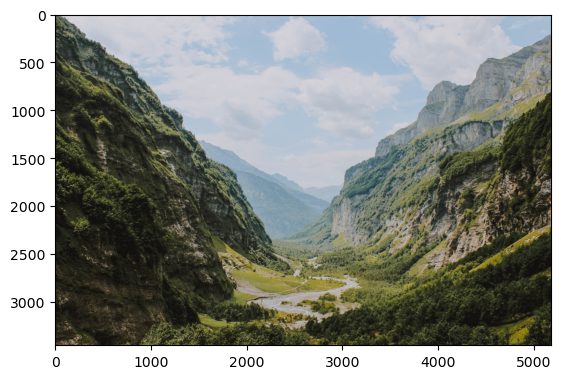

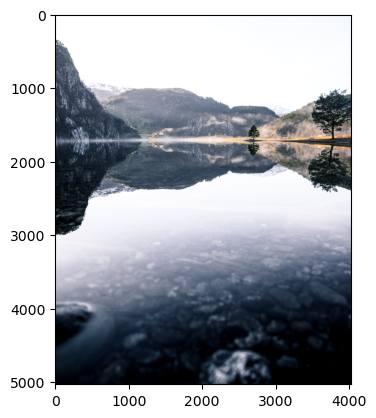

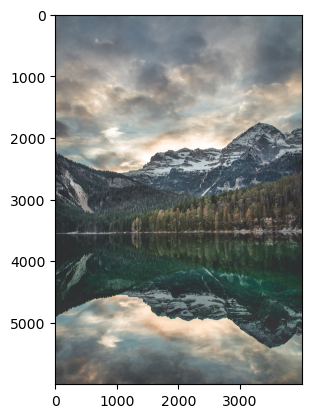

In [17]:
sample_image_1_embed=np.array(model1.encode(sample_image1, show_progress_bar=True))
cosine_sims = [cosine_sim(sample_image_1_embed,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
print("inserted image:")
plt.imshow(sample_image1)
plt.show()
print("similar images by CLIP:")
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

### 2b. Searching using this image "/kaggle/input/sampleinput/jerry-zhang-SJGiS1JzUCc-unsplash.jpg"

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inserted image:


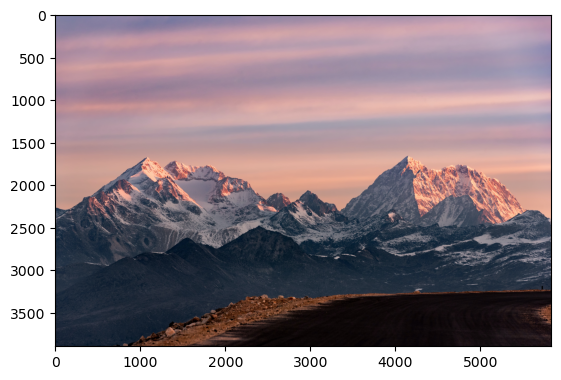

similar images by CLIP:


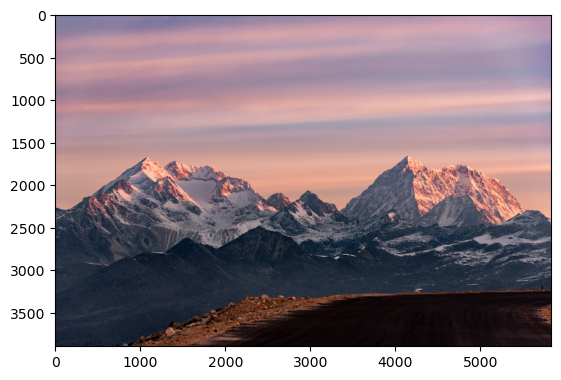

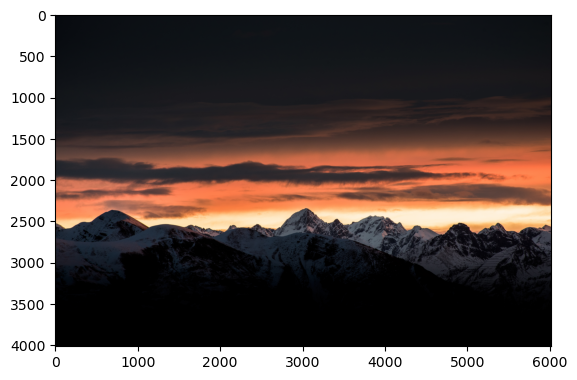

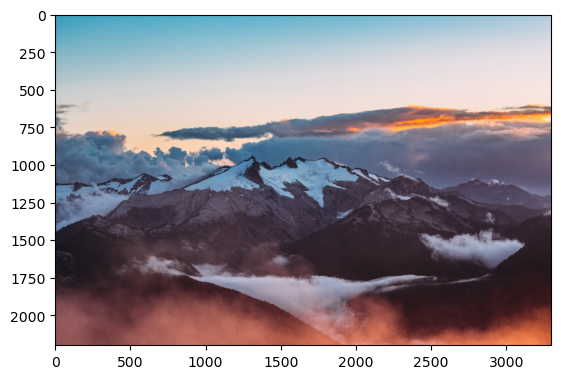

In [18]:
sample_image_1_embed=np.array(model1.encode(sample_image2, show_progress_bar=True))
cosine_sims = [cosine_sim(sample_image_1_embed,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
print("inserted image:")
plt.imshow(sample_image2)
plt.show()
print("similar images by CLIP:")
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

### 2c. Searching using this image "/kaggle/input/sampleinput/keith-tanner-f-U6iHYUzO8-unsplash.jpg"

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inserted image:


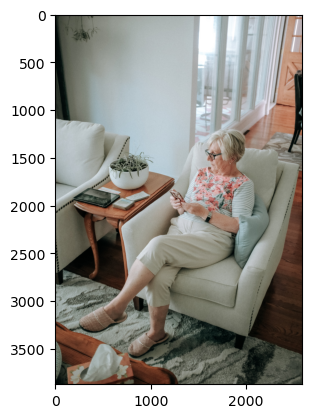

similar images by CLIP:


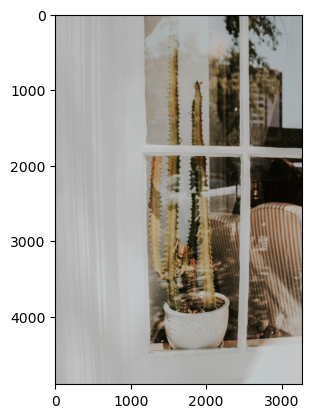

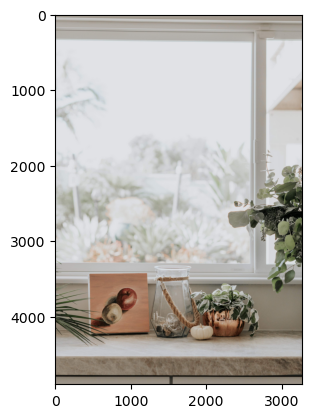

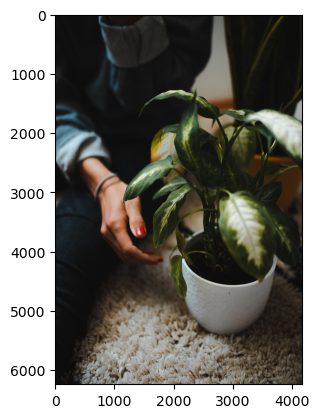

In [19]:
sample_image_1_embed=np.array(model1.encode(sample_image3, show_progress_bar=True))
cosine_sims = [cosine_sim(sample_image_1_embed,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
print("inserted image:")
plt.imshow(sample_image3)
plt.show()
print("similar images by CLIP:")
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()

## 3.Combining Image and Text:

With text and images mapped to the same vector space, it becomes possible to combine them in meaningful ways. By feeding the model two inputs, one image and one text, we can generate an output image that combines the features of both inputs.

The process involves first conducting a text search for an image and then modifying the search query by adding another image to the search query. This allows for the transfer of certain features from the image to the text query, which can lead to more accurate results.

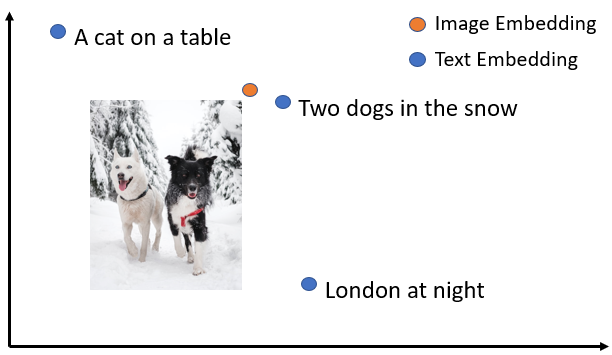


To achieve this, we multiply the features of the image with a weight in order to reduce their influence and ensure that the text query remains the primary source.

It's important to note that the results of this process can be sensitive to the prompt and the quality of the images and text used. Nevertheless, this approach has shown promise in improving the accuracy of image searches based on text queries.

Inspiration: https://github.com/haltakov/natural-language-image-search

### 3a. Searching using this image "/kaggle/input/sampleinput/alice-triquet-HeEJU3nrg_0-unsplash.jpg" and this text query "mountains"

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inserted image:


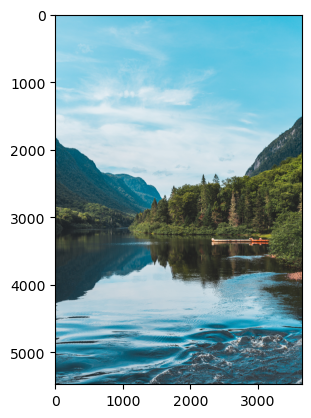

similar images by CLIP:


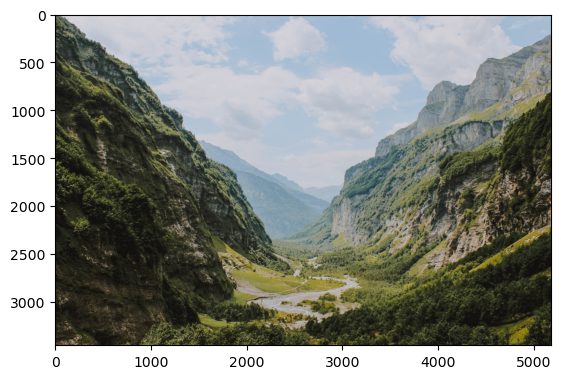

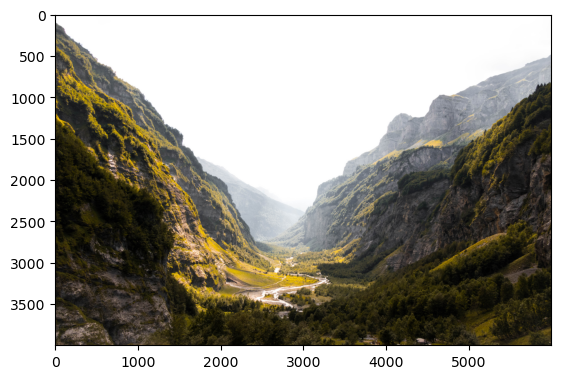

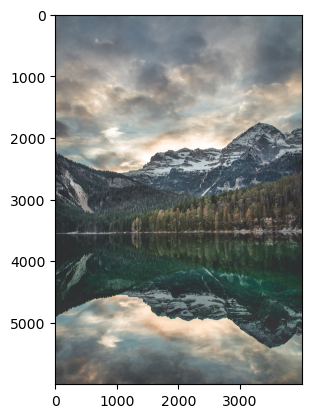

In [26]:
sample_image1= Image.open("/kaggle/input/sampleinput/alice-triquet-HeEJU3nrg_0-unsplash.jpg")
sample_image_1_embed=np.array(model1.encode(sample_image1, show_progress_bar=True))
example_query_embed=np.array(model1.encode("mountains", show_progress_bar=True))
result=example_query_embed+sample_image_1_embed
arr_normalized = (result - np.mean(result)) / (np.max(result))

#arr_normalized = result / normalized_arr

cosine_sims = [cosine_sim(arr_normalized,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
print("inserted image:")
plt.imshow(sample_image1)
plt.show()
print("similar images by CLIP:")
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()


### 3b. Searching using this image "/kaggle/input/sampleinput/keith-tanner-f-U6iHYUzO8-unsplash.jpg" and this text query "happy life"

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

inserted image:


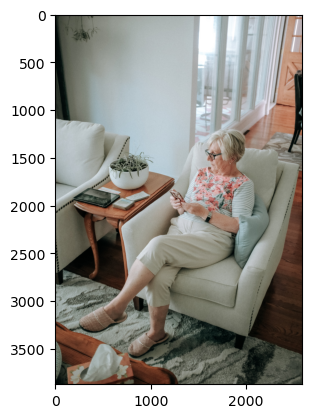

similar images by CLIP:


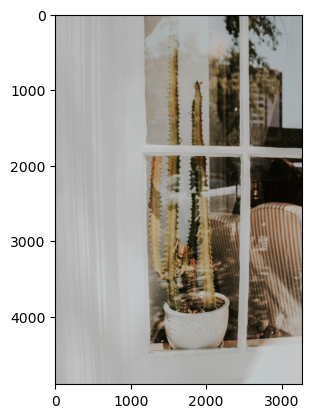

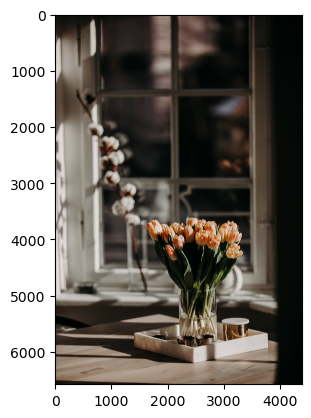

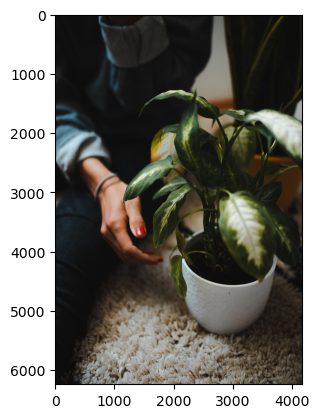

In [31]:
query='happy life'

sample_image_3_embed=np.array(model1.encode(sample_image3, show_progress_bar=True))
example_query_embed=np.array(model1.encode("dark night", show_progress_bar=True))
result=example_query_embed+sample_image_3_embed
arr_normalized = (result - np.mean(result)) / (np.max(result))

#arr_normalized = result / normalized_arr

cosine_sims = [cosine_sim(arr_normalized,embedding) for embedding in img_embeddings]
n = 3
top_n_indices = np.argsort(-np.array(cosine_sims))[:n]
selected_rows = df2.loc[top_n_indices.tolist(), 'photo_image_url']
print("inserted image:")
plt.imshow(sample_image3)
plt.show()
print("similar images by CLIP:")
for i,url in enumerate(selected_rows):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    plt.imshow(img)
    plt.show()


## 4.Video Search Engine:

A video search engine powered by the Contrastive Language-Image Pre-Training (CLIP) model from Hugging Face can greatly enhance users' ability to find relevant videos, even if they don't use precise keywords or phrases. CLIP is a state-of-the-art model with diverse applications, including image and text search. The video search engine utilizing CLIP would work as follows:

The user inputs a search query into the video search engine, such as "dogs playing in the park."
The search engine utilizes the CLIP model to analyze both the text and visual content of frames in its database that match the search query.
The CLIP model generates a vector representation for each frame based on its semantic meaning and visual content.
The search engine compares the vector representation of each frame to the user's query and ranks the frames by similarity.
The search engine displays a list of video frames that match the search query.
Overall, the use of CLIP enables the search engine to understand the semantic meaning of both text and images, allowing for more accurate and efficient retrieval of relevant videos based on users' queries.

Inspiration: https://www.storminthecastle.com/posts/video_search/

## Inserting a sample video:

For our project, we have chosen a small video showcasing Positano, Italy. The video can be found in the following link: https://drive.google.com/file/d/1ZWJJuH6WdH5y56mZClCfcoF-lMPM8k9k/view

To process the video, we will be using the Python OpenCV module, which provides easy loading and decoding of video frames. However, one minor inconvenience with OpenCV is that it works with pixel data in the BGR pixel format, while the CLIP model has been trained on images in the RGB pixel format, which is the more common convention. As a result, we will need to convert any pixel data obtained from OpenCV to RGB. Fortunately, OpenCV provides a function called cvtColor for converting between pixel formats.

In [54]:
cap = cv2.VideoCapture('/kaggle/input/positano/positano.mp4')
cap.set(cv2.CAP_PROP_POS_FRAMES, 500)
ret, frame = cap.read()
frame = cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)

In [59]:
url = 'https://drive.google.com/file/d/1ZWJJuH6WdH5y56mZClCfcoF-lMPM8k9k/view'
from IPython.display import HTML
HTML(f"""<video src={url} autoplay loop width=600 controls/>""")

Here, we have decided to choose one frame per second from the video.

The video_duration function is used to determine the duration of the video in seconds.

The video_frame function is used to retrieve a frame for a specific second of the video.

In [252]:
def video_duration(path):
  video = cv2.VideoCapture(path)
  fps = video.get(cv2.CAP_PROP_FPS)
  frame_count = video.get(cv2.CAP_PROP_FRAME_COUNT)
  return frame_count/fps

a=video_duration('/kaggle/input/positano/positano.mp4')

In [255]:
def video_frame(path,timestamp):
  video = cv2.VideoCapture(path)
  fps = video.get(cv2.CAP_PROP_FPS)
  video.set(cv2.CAP_PROP_POS_MSEC, timestamp * 1000)
  ret,frame = video.read()
  frame = cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
  return frame if ret else None

We start by creating embeddings of each second of the video and saving them in a list called video_embeddings. Then, we calculate the cosine similarity between a random input query by the user and the video_embeddings list.

In [260]:
video_embeddings=[]
for i in range(int(a)):
    f=video_frame('/kaggle/input/positano/positano.mp4',i)
    frame_embedding = model1.encode(Image.fromarray(f),show_progress_bar=False, convert_to_tensor=True)
    video_embeddings.append(frame_embedding)

    

As evident, we have captured one frame for each second of the video to avoid any redundancy in the embeddings.

In [261]:
len(video_embeddings)

151

In [266]:
# Get the text embedding
text = "beach"
text_embedding = model1.encode(text, convert_to_tensor=True)
#frame_embeddings = np.vstack(frame_embeddings)
# Calculate the cosine similarity between the text embedding and each frame embedding
cosine_sims = [cosine_similarity(text_embedding.reshape(1, 512),frame.reshape(1, 512))[0,0] for frame in video_embeddings]
#print(len(cosine_sims))
# Sort the frames by similarity
sorted_frames = np.argsort(cosine_sims)[::-1]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

55


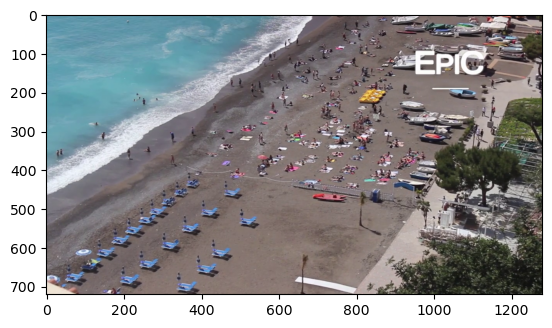

54


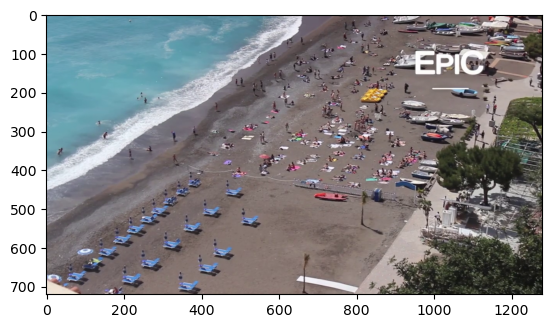

53


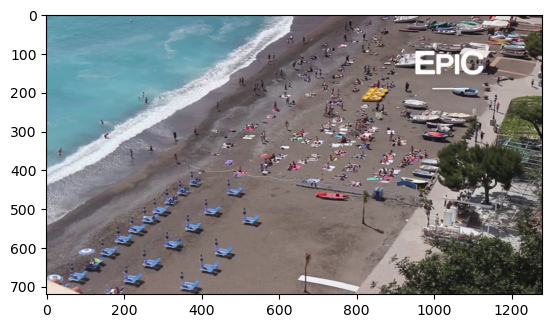

60


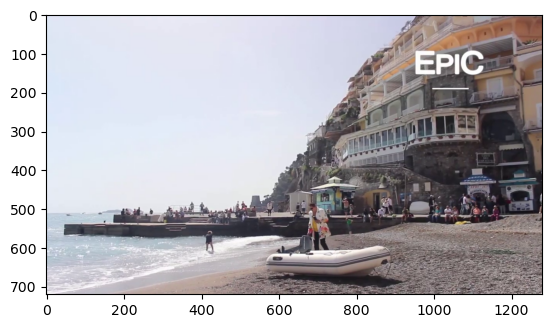

61


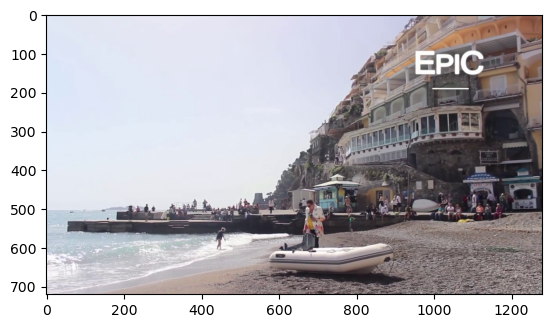

62


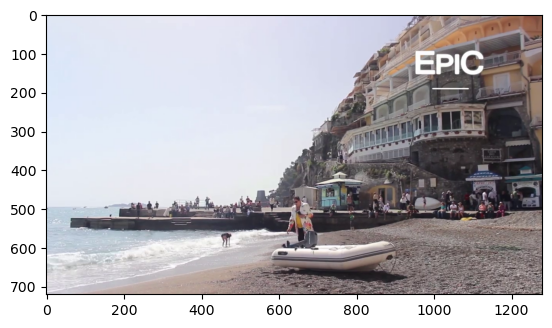

27


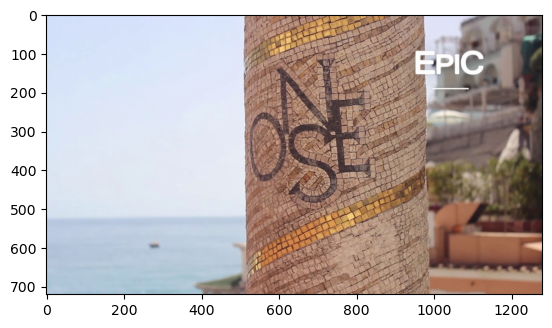

In [270]:
for i in range(7):
    index=sorted_frames[i]
    print(index)
    frame=video_frame('/kaggle/input/positano/positano.mp4',index)
    plt.imshow(frame)
    plt.show()
    
    

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

112


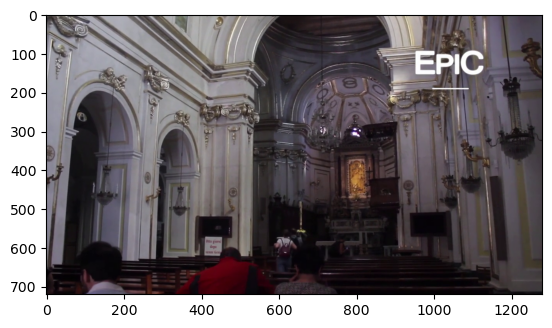

111


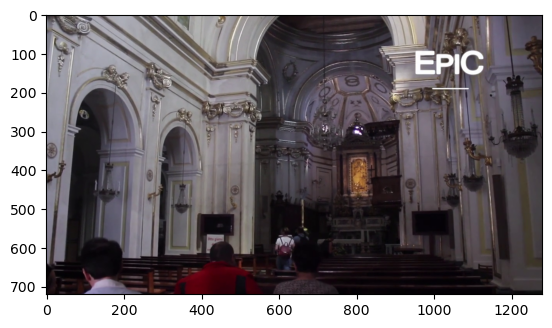

108


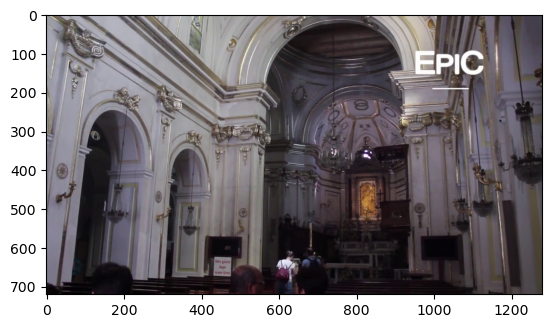

113


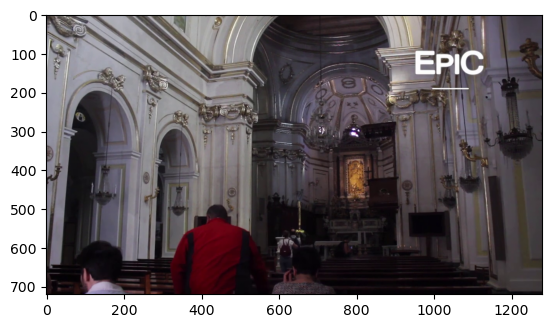

110


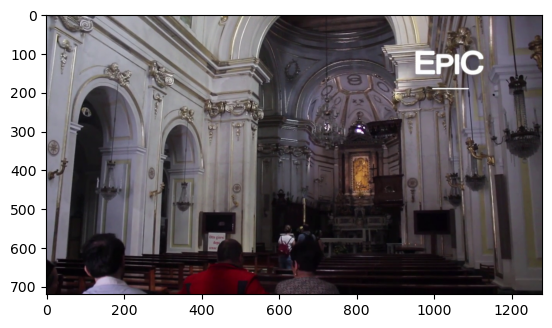

109


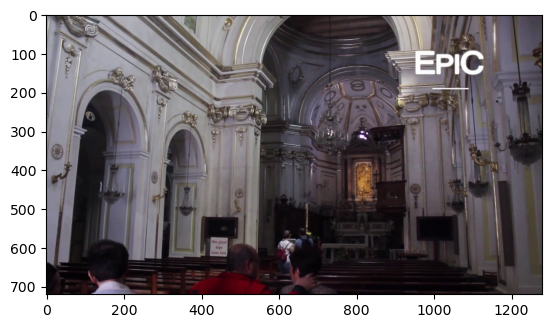

107


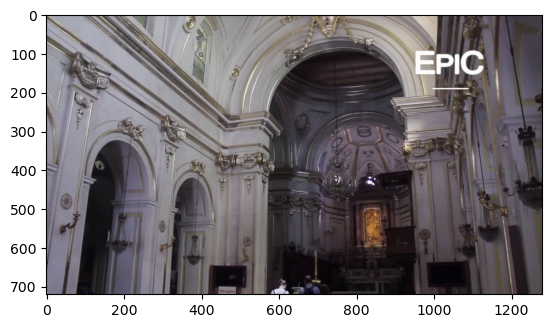

In [273]:
text = "church"
text_embedding = model1.encode(text, convert_to_tensor=True)
#frame_embeddings = np.vstack(frame_embeddings)
# Calculate the cosine similarity between the text embedding and each frame embedding
cosine_sims = [cosine_similarity(text_embedding.reshape(1, 512),frame.reshape(1, 512))[0,0] for frame in video_embeddings]
#print(len(cosine_sims))
# Sort the frames by similarity
sorted_frames = np.argsort(cosine_sims)[::-1]
for i in range(7):
    index=sorted_frames[i]
    print(index)
    frame=video_frame('/kaggle/input/positano/positano.mp4',index)
    plt.imshow(frame)
    plt.show()


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

6


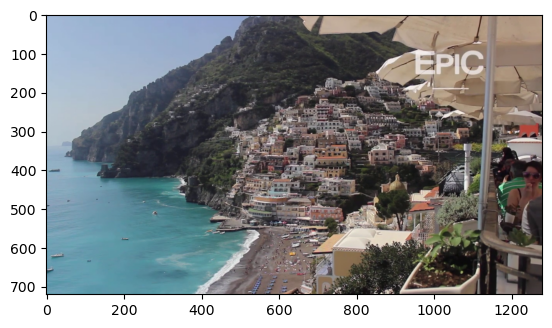

12


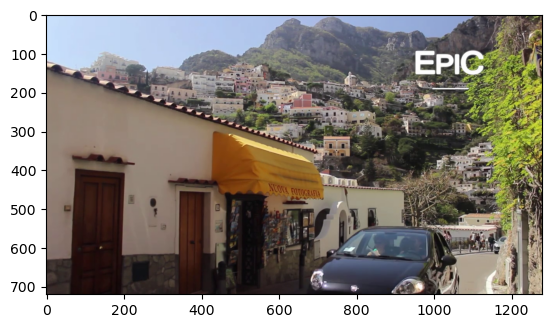

38


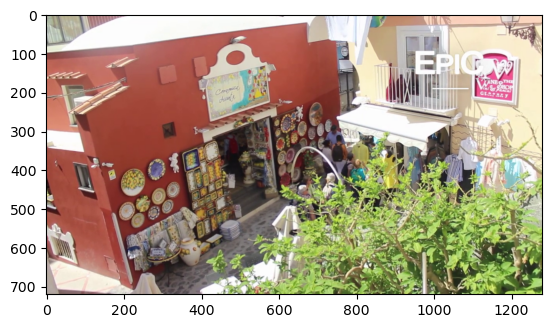

126


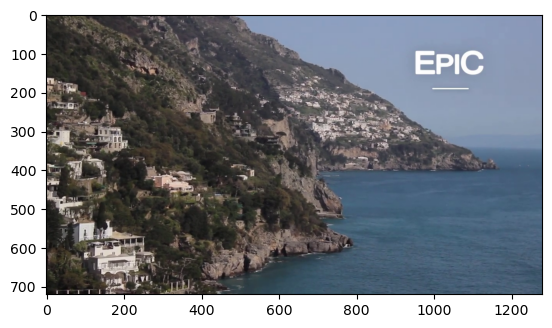

11


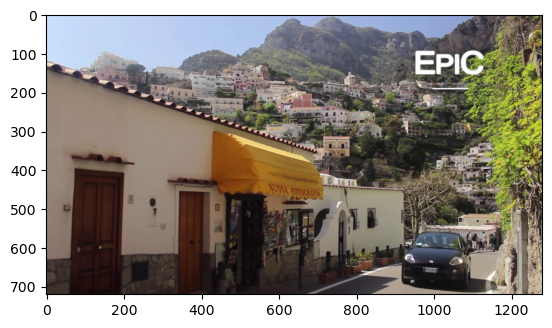

10


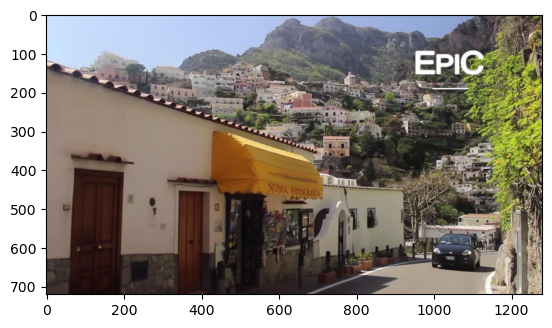

125


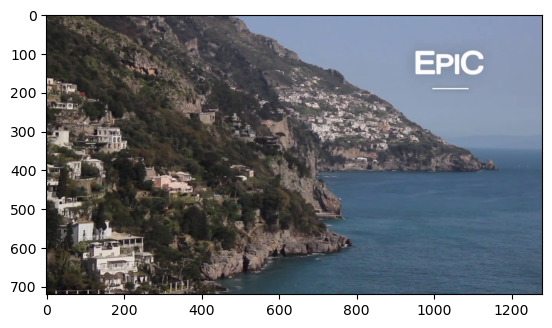

In [274]:
text = "village"
text_embedding = model1.encode(text, convert_to_tensor=True)
#frame_embeddings = np.vstack(frame_embeddings)
# Calculate the cosine similarity between the text embedding and each frame embedding
cosine_sims = [cosine_similarity(text_embedding.reshape(1, 512),frame.reshape(1, 512))[0,0] for frame in video_embeddings]
#print(len(cosine_sims))
# Sort the frames by similarity
sorted_frames = np.argsort(cosine_sims)[::-1]
for i in range(7):
    index=sorted_frames[i]
    print(index)
    frame=video_frame('/kaggle/input/positano/positano.mp4',index)
    plt.imshow(frame)
    plt.show()


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

28


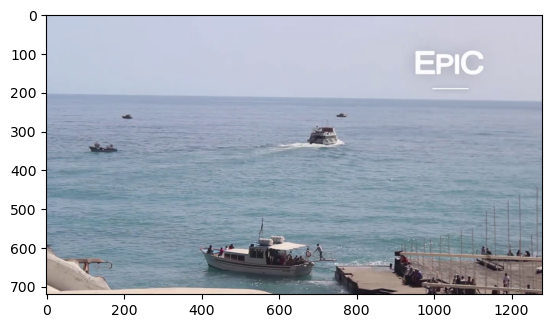

30


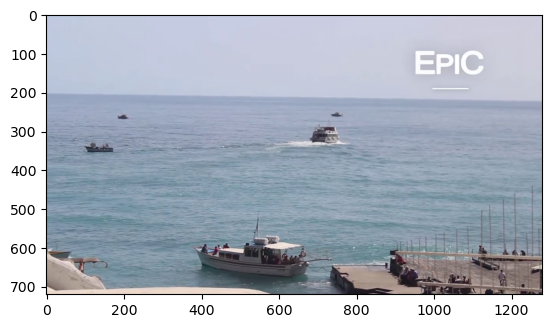

31


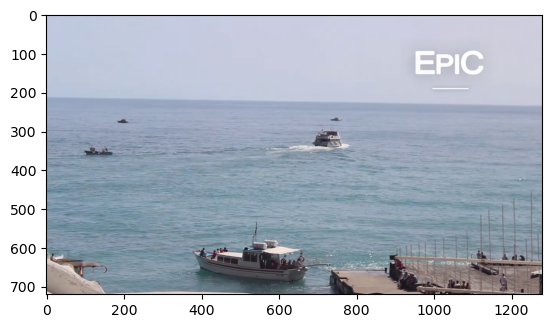

29


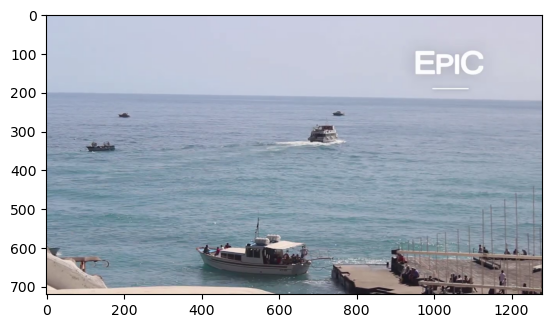

56


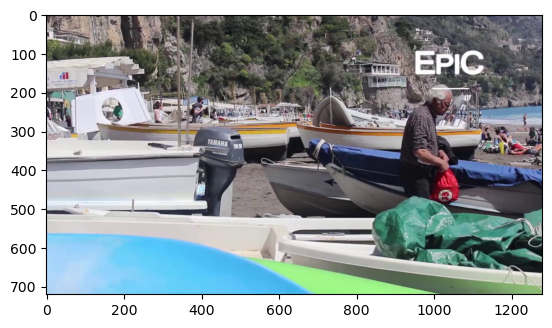

58


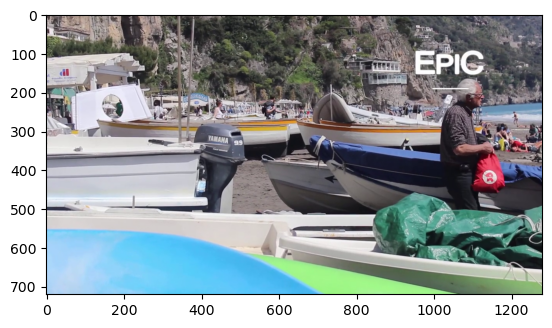

57


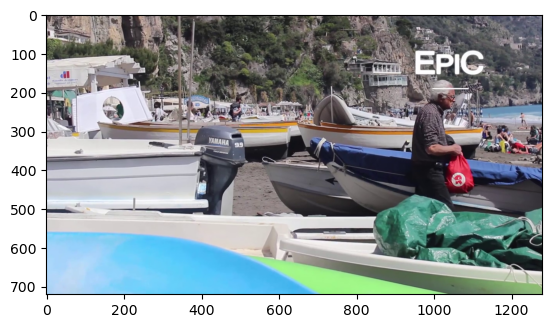

In [275]:
text = "boat"
text_embedding = model1.encode(text, convert_to_tensor=True)
#frame_embeddings = np.vstack(frame_embeddings)
# Calculate the cosine similarity between the text embedding and each frame embedding
cosine_sims = [cosine_similarity(text_embedding.reshape(1, 512),frame.reshape(1, 512))[0,0] for frame in video_embeddings]
#print(len(cosine_sims))
# Sort the frames by similarity
sorted_frames = np.argsort(cosine_sims)[::-1]
for i in range(7):
    index=sorted_frames[i]
    print(index)
    frame=video_frame('/kaggle/input/positano/positano.mp4',index)
    plt.imshow(frame)
    plt.show()


## Conclusion
In conclusion, this project has demonstrated the remarkable capability of artificial intelligence in facilitating various applications and daily tasks. The development of a mini Google Image search using the CLIP model has been a challenging yet fascinating experience. Despite the limitations of our mini search engine in comparison to the original image search, we are proud of what we have accomplished given the time and computational power available. Furthermore, we believe that this project has potential for extension in various domains, such as medical imaging for breast cancer detection, educational and curation purposes, and even video-to-video "mini youtube" and music/audio "mini spotify" searches. Our success in developing this project in just a few days has given us confidence in our ability to take on similar challenges in the future. Overall, we are excited to continue exploring the possibilities of artificial intelligence and its potential to revolutionize the way we search and discover information

## Future works:

1. Experiment with larger CLIP models such as 'RN50', 'RN101', 'RN50x4', 'RN50x16', 'ViT-B/32', 'ViT-B/16' to see if they can improve the performance of our image search engine.

2. Use Faiss as an alternative similarity measure. Faiss is a Facebook library that facilitates efficient similarity search and clustering of dense vectors. It offers numerous features such as basic vector similarity search without clustering or compression, partitioned index with Voronoi cells to conduct an approximate search (to speed up the search), and vector compression using product quantization (to reduce the memory footprint).

3. Implement zero-shot classification with CLIP. Zero-shot learning enables models to classify unseen images by leveraging the ability to understand the semantic meaning of images and text. This can further enhance the functionality and efficiency of our image search engine.

## References:
1.https://arxiv.org/abs/2103.0002 (explanation of CLIP)
2.https://github.com/unsplash/datasets (Unsplash dataset)
3.https://huggingface.co/sentence-transformers/clip-ViT-B-32 (Hugging face source of model)
4.https://github.com/UKPLab/sentence-transformers/blob/master/examples/applications/image-search/Image_Search.ipynb (image to image search inspiration)
5.https://github.com/haltakov/natural-language-image-search (inspiration for combining image and text)
6.https://www.storminthecastle.com/posts/video_search/ (Video search ideation)
7.https://chat.openai.com/chat (for definitions and solving our countless errors)